## Resumen Ejecutivo

Este proyecto implementa un pipeline completo de análisis geoespacial para la clasificación automática de coberturas del suelo utilizando imágenes satelitales Sentinel-2. La metodología combina técnicas de segmentación de imágenes (SLIC) con algoritmos de machine learning no supervisado (K-Means y Gaussian Mixture Models) para generar mapas de cobertura del suelo de alta precisión.

**Objetivos:**
- Desarrollar un sistema automatizado de clasificación de coberturas del suelo
- Comparar diferentes técnicas de segmentación y clustering
- Generar mapas temáticos interpretables para análisis territorial
- Evaluar la separabilidad espectral de diferentes clases de cobertura

**Resultados Clave:**
- Clasificación exitosa en 5-7 clases principales (agua, vegetación, suelo desnudo, zonas urbanas)
- Implementación de múltiples algoritmos con evaluación comparativa
- Exportación de resultados en formatos GIS estándar para integración con herramientas profesionales



---

## 1. Contexto y Problema

### 1.1 Motivación

La clasificación de cobertura del suelo es fundamental para múltiples aplicaciones:
- **Planificación urbana y territorial**: Identificación de áreas urbanas, agrícolas y naturales
- **Monitoreo ambiental**: Seguimiento de cambios en vegetación, cuerpos de agua y uso del suelo
- **Agricultura de precisión**: Delimitación de parcelas y tipos de cultivo
- **Gestión de recursos hídricos**: Identificación y monitoreo de cuerpos de agua

### 1.2 Desafío Técnico

Las imágenes satelitales contienen información espectral rica pero requieren procesamiento avanzado para extraer información semántica útil. Los desafíos principales incluyen:

- **Variabilidad espectral**: Múltiples objetos pueden tener firmas espectrales similares
- **Ruido y variabilidad espacial**: Necesidad de agrupar píxeles similares espacialmente
- **Escalabilidad**: Procesamiento eficiente de imágenes de alta resolución
- **Interpretabilidad**: Generar resultados que puedan ser validados y utilizados por expertos

### 1.3 Enfoque Propuesto

Este proyecto implementa una metodología híbrida que combina:
1. **Segmentación de imágenes** para agrupar píxeles espacialmente coherentes
2. **Machine Learning no supervisado** para identificar patrones espectrales
3. **Análisis espectral** para validar y asignar clases semánticas
4. **Visualización geoespacial** para presentar resultados interpretables


In [4]:
# ============================================================================
# CONFIGURACIÓN E IMPORTS
# ============================================================================

# Librerías para procesamiento de datos geoespaciales
import rasterio
from rasterio.crs import CRS
from rasterio.warp import calculate_default_transform, reproject, Resampling
import os

# Librerías para procesamiento de imágenes y segmentación
import numpy as np
from skimage.segmentation import slic, mark_boundaries
import matplotlib.pyplot as plt
from scipy import ndimage
import cv2

# Librerías para machine learning
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Librerías para análisis de datos
import pandas as pd

# Librerías para visualización
from matplotlib.colors import ListedColormap

# Configuración de visualización
plt.style.use('seaborn-v0_8-darkgrid')


#print("✅ Todas las librerías importadas correctamente")

---

## 2. Datos

### 2.1 Fuente de Datos

Utilizamos imágenes satelitales **Sentinel-2** del programa Copernicus de la Agencia Espacial Europea (ESA). Sentinel-2 captura imágenes en 13 bandas espectrales con resolución espacial de 10m, 20m y 60m.

**Características de los datos:**
- **Sensor**: Sentinel-2 MSI (MultiSpectral Instrument)
- **Resolución espacial**: 20m (bandas resampleadas)
- **Bandas utilizadas**: B2 (Azul), B3 (Verde), B4 (Rojo), B5, B6, B7, B8A (NIR), B11 (SWIR1), B12 (SWIR2)
- **Formato**: GeoTIFF con proyección UTM
- **Área de estudio**: Región de Córdoba, Argentina

In [5]:
# ============================================================================
# CONFIGURACIÓN DE RUTAS Y CARPETAS
# ============================================================================

# Definir rutas (usar carpeta actual del notebook/workspace)
carpeta_actual = os.getcwd()
carpeta_datos = carpeta_actual
carpeta_salidas = carpeta_actual

# Crear carpeta de salidas si no existe
os.makedirs(carpeta_salidas, exist_ok=True)

#print(f"📁 Carpeta de datos: {carpeta_datos}")
#print(f"📁 Carpeta de salidas: {carpeta_salidas}")
#print(f"✅ Configuración de rutas completada")

In [6]:
# ============================================================================
# CARGA DE DATOS
# ============================================================================

# Cargar imagen Sentinel-2
archivo_imagen = 'T20HLK_20240127T195552_20m_aoi.tif'
ruta_imagen = os.path.join(carpeta_datos, archivo_imagen)

#print(f"📥 Cargando imagen: {archivo_imagen}")

with rasterio.open(ruta_imagen) as src:
    stack = src.read()  # Array numpy: (bandas, filas, columnas)
    metadata = src.meta.copy()  # Metadatos geográficos (CRS, transform, etc.)

# Información de la imagen
n_bandas, altura, ancho = stack.shape
#print(f"\n✅ Imagen cargada exitosamente")
#print(f"   Dimensiones: {n_bandas} bandas × {altura} filas × {ancho} columnas")
#print(f"   Resolución espacial: {metadata['transform'][0]:.1f}m")
#print(f"   Sistema de coordenadas: {metadata['crs']}")
#print(f"   Tipo de datos: {metadata['dtype']}")

# Visualizar estadísticas básicas
print(f"\n📊 Estadísticas por banda:")
for i in range(n_bandas):
    banda = stack[i]
    print(f"   Banda {i+1}: min={banda.min():.0f}, max={banda.max():.0f}, media={banda.mean():.1f}")


📊 Estadísticas por banda:
   Banda 1: min=0, max=11950, media=1354.7
   Banda 2: min=0, max=12133, media=1594.8
   Banda 3: min=0, max=13281, media=1516.1
   Banda 4: min=0, max=15297, media=1941.9
   Banda 5: min=0, max=14092, media=3134.9
   Banda 6: min=0, max=16641, media=3515.1
   Banda 7: min=0, max=14644, media=3729.3
   Banda 8: min=0, max=14416, media=2893.7
   Banda 9: min=0, max=14981, media=2133.9


### 2.2 Visualización de la Imagen Original

A continuación visualizamos la imagen en composición RGB (bandas 4, 3, 2 correspondientes a Rojo, Verde, Azul) para tener una referencia visual del área de estudio.

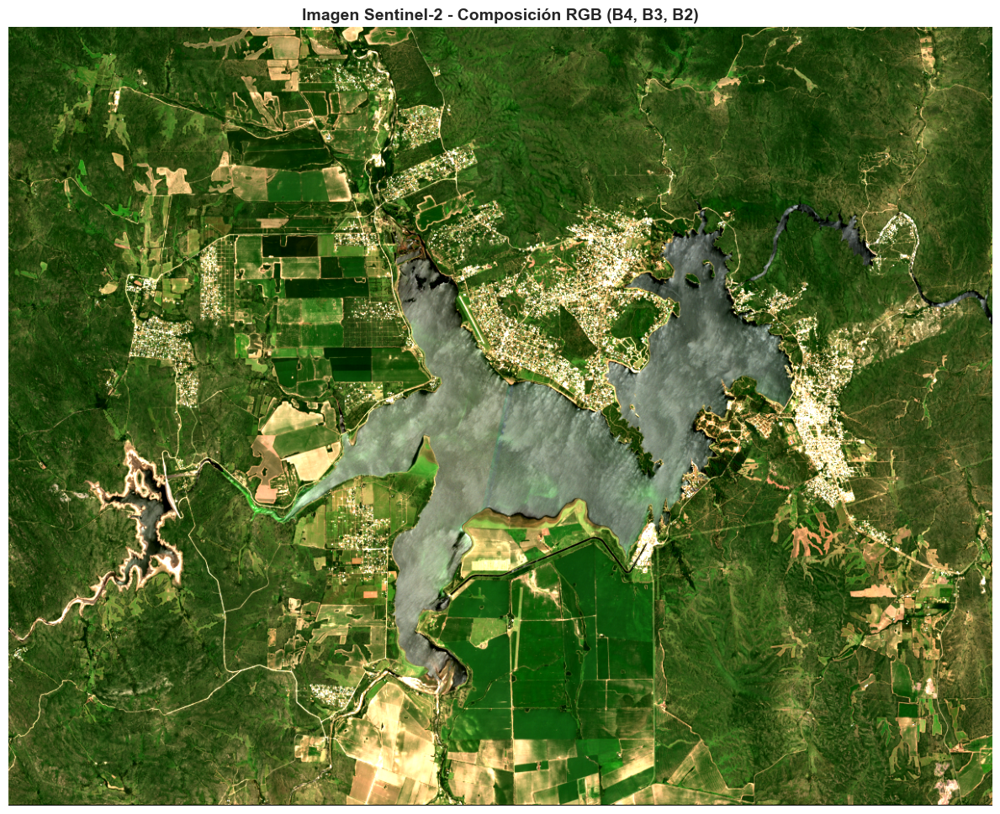

In [7]:
# ============================================================================
# VISUALIZACIÓN DE LA IMAGEN ORIGINAL
# ============================================================================

# Preparar composición RGB (bandas 4, 3, 2 = Rojo, Verde, Azul)
# Nota: stack tiene forma (bandas, filas, columnas)
# Sentinel-2: B2=índice 0 (azul), B3=índice 1 (verde), B4=índice 2 (rojo)
rgb_bands = [2, 1, 0]  # Rojo, Verde, Azul
rgb_image = stack[rgb_bands, :, :].transpose(1, 2, 0)  # Reordenar a (filas, columnas, bandas)

# Normalización para visualización (estirar histograma al 2-98 percentil)
p2, p98 = np.percentile(rgb_image, (2, 98))
rgb_normalized = np.clip((rgb_image - p2) / (p98 - p2), 0, 1)

# Visualizar
fig, ax = plt.subplots(figsize=(12, 10))
ax.imshow(rgb_normalized)
ax.set_title('Imagen Sentinel-2 - Composición RGB (B4, B3, B2)', fontsize=14, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()

#print("✅ Imagen original visualizada")

---

## 3. Enfoque metodológico

### 3.1 Pipeline de Procesamiento

El proceso de clasificación sigue estos pasos:

1. **Preprocesamiento**: Normalización y preparación de bandas espectrales
2. **Segmentación**: Agrupación de píxeles espacialmente coherentes usando SLIC
3. **Extracción de características**: Cálculo de estadísticas espectrales por segmento
4. **Clustering**: Aplicación de algoritmos no supervisados (K-Means, GMM)
5. **Análisis espectral**: Validación mediante firmas espectrales
6. **Post-procesamiento**: Asignación de clases semánticas y generación de mapas

### 3.2 Algoritmos Utilizados

**Segmentación SLIC (Simple Linear Iterative Clustering)**
- Agrupa píxeles en "superpíxeles" espacialmente coherentes
- Reduce la dimensionalidad del problema (de ~1M píxeles a ~300 segmentos)
- Preserva bordes y estructuras espaciales

**K-Means Clustering**
- Algoritmo de clustering particional
- Rápido y eficiente para grandes volúmenes de datos
- Requiere especificar el número de clusters (k)

**Gaussian Mixture Models (GMM)**
- Modela distribuciones de probabilidad para cada clase
- Permite asignaciones probabilísticas (más flexible que K-Means)
- Mejor para capturar transiciones graduales entre clases

---

## 4. Análisis y Resultados

### 4.1 Segmentación de Imágenes

El primer paso es agrupar píxeles espacialmente cercanos y espectralmente similares en "superpíxeles" o segmentos. Esto reduce el ruido y mejora la coherencia espacial de la clasificación final.

#### 4.1.1 Optimización de Parámetros de Segmentación

Para seleccionar los mejores parámetros, evaluamos múltiples configuraciones de SLIC comparando métricas de calidad como el número de segmentos, tamaño promedio y variabilidad.

In [8]:
# ============================================================================
# FUNCIONES AUXILIARES PARA EVALUACIÓN DE SEGMENTACIÓN
# ============================================================================

def evaluate_segmentation_quality(segments, rgb_image):
    """
    Evalúa la calidad de una segmentación usando métricas básicas.
    
    Parámetros:
    -----------
    segments : array
        Matriz de segmentos etiquetados
    rgb_image : array
        Imagen RGB normalizada
        
    Retorna:
    --------
    dict : Diccionario con métricas de calidad
    """
    n_segments = segments.max()
    
    # Calcular estadísticas de tamaño de segmentos
    segment_sizes = np.bincount(segments.flatten())
    segment_sizes = segment_sizes[segment_sizes > 0]  # Remover segmentos vacíos
    
    metrics = {
        'n_segments': n_segments,
        'avg_size': np.mean(segment_sizes),
        'std_size': np.std(segment_sizes),
        'min_size': np.min(segment_sizes),
        'max_size': np.max(segment_sizes),
        'size_ratio': np.max(segment_sizes) / np.min(segment_sizes) if np.min(segment_sizes) > 0 else float('inf')
    }
    
    return metrics

def compare_segmentations(segmentations_dict, rgb_image, title="Comparación de Segmentaciones"):
    """
    Compara múltiples configuraciones de segmentación visual y numéricamente.
    
    Parámetros:
    -----------
    segmentations_dict : dict
        Diccionario {nombre: array_segmentos}
    rgb_image : array
        Imagen RGB para visualización
    title : str
        Título de la figura
    """
    # Calcular dinámicamente el layout según el número de segmentaciones
    n_segmentations = len(segmentations_dict)
    n_segmentations = min(n_segmentations, 6)  # Máximo 6 visualizaciones
    
    # Calcular número de filas y columnas
    if n_segmentations <= 3:
        n_rows, n_cols = 1, n_segmentations
        figsize = (6 * n_cols, 6)
    elif n_segmentations <= 6:
        n_rows, n_cols = 2, 3
        figsize = (18, 12)
    else:
        n_rows, n_cols = 2, 3
        figsize = (18, 12)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    # Asegurar que axes sea siempre una lista/array 1D
    if n_segmentations == 1:
        axes = [axes]  # Convertir a lista si solo hay un subplot
    elif hasattr(axes, 'flatten'):
        axes = axes.flatten()  # Aplanar si es un array 2D
    else:
        axes = [axes]  # Convertir a lista si es un solo objeto
    
    metrics_summary = {}
    
    for i, (name, segments) in enumerate(segmentations_dict.items()):
        if i >= n_segmentations:  # Máximo según el layout calculado
            break
        
        # Visualizar segmentación
        axes[i].imshow(mark_boundaries(rgb_image, segments, color=(1, 0, 0), mode='thick'))
        axes[i].set_title(f"{name}\n({segments.max()} segmentos)", fontweight='bold')
        axes[i].axis("off")
        
        # Calcular métricas
        metrics = evaluate_segmentation_quality(segments, rgb_image)
        metrics_summary[name] = metrics
        
        print(f"\n{'='*50}")
        print(f"{name.upper()}")
        print(f"{'='*50}")
        print(f"  Segmentos generados: {metrics['n_segments']}")
        print(f"  Tamaño promedio: {metrics['avg_size']:.1f} píxeles")
        print(f"  Desviación estándar: {metrics['std_size']:.1f}")
        print(f"  Rango: {metrics['min_size']} - {metrics['max_size']} píxeles")
        print(f"  Ratio (max/min): {metrics['size_ratio']:.2f}")
    
    # Ocultar ejes vacíos si los hay
    for i in range(n_segmentations, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return metrics_summary

## Evaluación de configuraciones de segmentación SLIC

Con el objetivo de identificar la segmentación más adecuada para el análisis espectral, se evaluaron múltiples configuraciones del algoritmo **SLIC (Simple Linear Iterative Clustering)**.  
Cada configuración representa un compromiso distinto entre **nivel de detalle**, **regularidad espacial** y **cantidad de superpíxeles** generados.



COMPACTO
  Segmentos generados: 258
  Tamaño promedio: 4489.2 píxeles
  Desviación estándar: 1133.3
  Rango: 2108 - 9306 píxeles
  Ratio (max/min): 4.41

BALANCEADO
  Segmentos generados: 329
  Tamaño promedio: 3520.4 píxeles
  Desviación estándar: 1152.9
  Rango: 1563 - 9373 píxeles
  Ratio (max/min): 6.00

DETALLADO
  Segmentos generados: 348
  Tamaño promedio: 3328.2 píxeles
  Desviación estándar: 1617.7
  Rango: 1230 - 12967 píxeles
  Ratio (max/min): 10.54


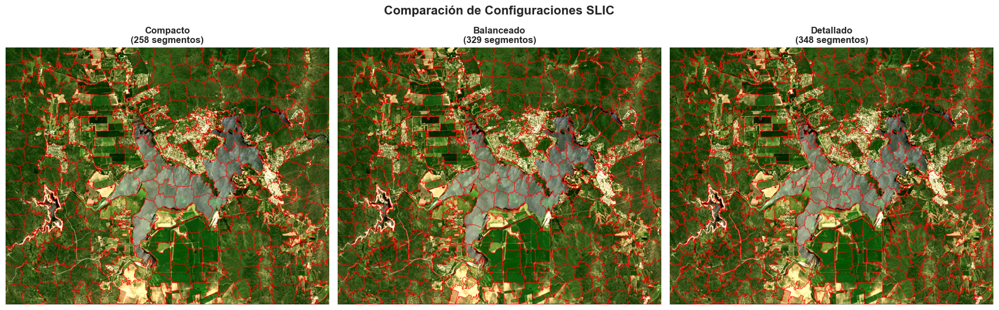

In [9]:
#| echo: false
#| warning: false
#| message: false

# ============================================================================
# EVALUACIÓN DE MÚLTIPLES CONFIGURACIONES DE SEGMENTACIÓN
# ============================================================================

slic_configs = {
    'Compacto': {'n_segments': 300, 'compactness': 20},
    'Balanceado': {'n_segments': 400, 'compactness': 15},
    'Detallado': {'n_segments': 500, 'compactness': 10},
}

slic_segmentations = {}

for name, config in slic_configs.items():
    segments = slic(
        rgb_normalized,
        n_segments=config['n_segments'],
        compactness=config['compactness'],
        start_label=1,
        sigma=1.0,
        slic_zero=False
    )
    slic_segmentations[name] = segments

metrics_slic = compare_segmentations(
    slic_segmentations,
    rgb_normalized,
    "Comparación de Configuraciones SLIC"
)

segmentos = slic_segmentations['Balanceado']
n_segmentos_final = segmentos.max()

bands, xsize, ysize = stack.shape
media_por_segmento = np.zeros((n_segmentos_final, bands))

for b in range(bands):
    media_por_segmento[:, b] = ndimage.mean(
        stack[b],
        labels=segmentos,
        index=np.arange(1, n_segmentos_final + 1)
    )


### Configuraciones evaluadas

Se analizaron tres configuraciones de SLIC:

- **Compacto**: menor número de segmentos y mayor regularidad espacial.
- **Balanceado**: compromiso entre detalle y estabilidad geométrica.
- **Detallado**: mayor número de segmentos, capturando variaciones espaciales finas.

La comparación se realizó tanto **visual** como **cuantitativamente**, evaluando coherencia espacial y separabilidad espectral.


### Resultados de la comparación

La configuración **Balanceado** mostró el mejor compromiso entre:

- Nivel de detalle espacial
- Estabilidad de los superpíxeles
- Robustez para el cálculo de estadísticas espectrales


In [10]:
#| echo: false
print(f"Configuración seleccionada: Balanceado")
print(f"Número final de segmentos: {n_segmentos_final}")
print(f"Matriz de características: {media_por_segmento.shape}")


Configuración seleccionada: Balanceado
Número final de segmentos: 329
Matriz de características: (329, 9)


### Decisión final

Se seleccionó la configuración **Balanceado**, ya que ofrece un equilibrio adecuado entre resolución espacial y estabilidad estadística.  
La segmentación resultante permitió recalcular características espectrales promedio por superpíxel, generando una matriz de dimensión:

**segmentos × bandas espectrales**, adecuada para etapas posteriores de clasificación y análisis no supervisado.


### 4.2 Clasificación No Supervisada

Una vez segmentada la imagen, aplicamos algoritmos de clustering para agrupar segmentos con características espectrales similares. Esto nos permite identificar diferentes tipos de cobertura del suelo sin necesidad de datos de entrenamiento etiquetados.

#### 4.2.1 Determinación del Número Óptimo de Clusters

Antes de aplicar K-Means, necesitamos determinar cuántos clusters (clases) son apropiados para nuestros datos. Utilizamos el **Método del Codo (Elbow Method)** para identificar el punto óptimo.

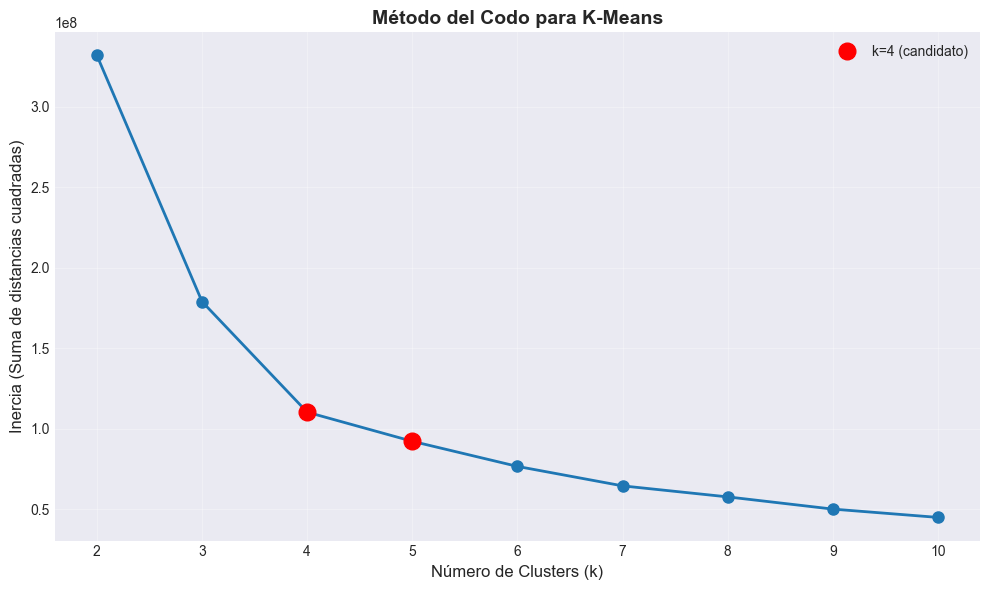

In [11]:
# ============================================================================
# MÉTODO DEL CODO PARA DETERMINAR NÚMERO ÓPTIMO DE CLUSTERS
# ============================================================================

# El método del codo busca el punto donde agregar más clusters no mejora significativamente
# la reducción de inercia (suma de distancias al cuadrado dentro de cada cluster)

#print("🔍 Aplicando método del codo para determinar k óptimo...")

# Preparar datos (usar características espectrales de segmentos)
X = media_por_segmento

# Probar diferentes valores de k
k_values = range(2, 11)
inertias = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)

# Visualizar curva del codo
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(k_values, inertias, 'o-', linewidth=2, markersize=8)
ax.set_xlabel('Número de Clusters (k)', fontsize=12)
ax.set_ylabel('Inercia (Suma de distancias cuadradas)', fontsize=12)
ax.set_title('Método del Codo para K-Means', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_xticks(k_values)

# Marcar posibles valores óptimos (k=4, k=5)
for k in [4, 5]:
    idx = k - 2
    ax.plot(k, inertias[idx], 'ro', markersize=12, label=f'k={k} (candidato)' if k == 4 else '')

ax.legend()
plt.tight_layout()
plt.show()

#print("✅ Análisis completado")
#print("   Recomendación: k=4 o k=5 parecen ser valores óptimos")
#print("   (punto donde la curva deja de disminuir rápidamente)")

#### 4.2.2 Clasificación con K-Means

Aplicamos K-Means con k=5 clusters, que ofrece un buen balance entre detalle y generalización según el análisis del método del codo.

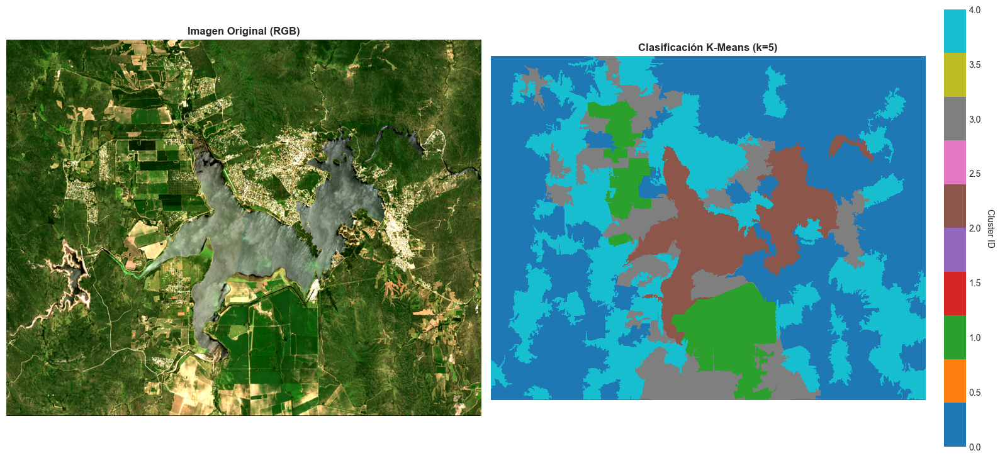

In [12]:
# ============================================================================
# CLASIFICACIÓN K-MEANS CON k=5
# ============================================================================

# Aplicar K-Means con k=5 (seleccionado mediante método del codo)
k = 5
#print(f"🔄 Aplicando K-Means con k={k} clusters...")

kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
etiquetas = kmeans.fit_predict(media_por_segmento)

# Asignar etiquetas de cluster a cada segmento
clasificado = etiquetas[segmentos - 1]

# Estadísticas de distribución
unique, counts = np.unique(etiquetas, return_counts=True)
#print(f"\n✅ Clasificación completada")
#print(f"\n📊 Distribución de segmentos por cluster:")
#for cluster, n_segments in zip(unique, counts):
#    porcentaje = (n_segments / len(etiquetas)) * 100
#    print(f"   Cluster {cluster}: {n_segments:3d} segmentos ({porcentaje:5.1f}%)")

# Visualizar resultado
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Imagen original
axes[0].imshow(rgb_normalized)
axes[0].set_title('Imagen Original (RGB)', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Clasificación
im = axes[1].imshow(clasificado, cmap='tab10', interpolation='nearest')
axes[1].set_title(f'Clasificación K-Means (k={k})', fontsize=12, fontweight='bold')
axes[1].axis('off')

# Agregar colorbar
cbar = plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
cbar.set_label('Cluster ID', rotation=270, labelpad=15)

plt.tight_layout()
plt.show()

#print("\n💾 Guardando resultado...")
# Exportar a GeoTIFF para análisis en QGIS
ruta_salida = os.path.join(carpeta_salidas, 'clasificacion_kmeans_k5.tif')
metadata_out = metadata.copy()
metadata_out.update(
    dtype=rasterio.uint8,
    count=1,
    compress='lzw'
)

with rasterio.open(ruta_salida, 'w', **metadata_out) as dst:
    dst.write(clasificado.astype(rasterio.uint8), 1)

#print(f"✅ Archivo exportado: {ruta_salida}")

#### 4.2.3 Clasificación con Gaussian Mixture Models (GMM)

Como alternativa a K-Means, implementamos Gaussian Mixture Models que modelan las distribuciones de probabilidad de cada clase. GMM es especialmente útil para capturar transiciones graduales entre clases y manejar mejor la variabilidad espectral.

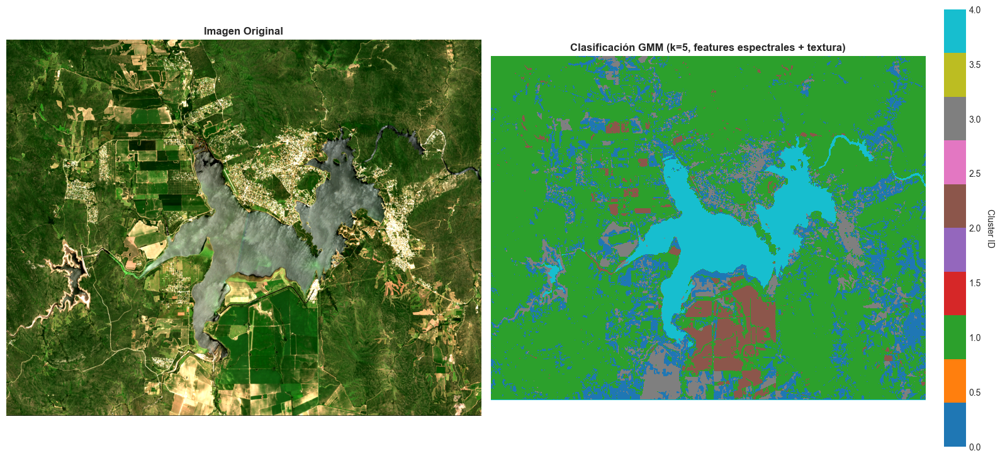

In [13]:
# ============================================================================
# CLASIFICACIÓN CON GAUSSIAN MIXTURE MODELS (GMM)
# ============================================================================

# GMM con características espectrales + textura para mejor separación
# Esto permite distinguir mejor entre clases espectralmente similares (ej: urbano vs suelo)

from scipy.ndimage import median_filter, uniform_filter


#print("🔄 Aplicando Gaussian Mixture Models...")

H, W, C = rgb_normalized.shape
img8 = (rgb_normalized * 255).astype(np.uint8)

# Extraer características espectrales en múltiples espacios de color
lab = cv2.cvtColor(img8, cv2.COLOR_RGB2LAB).astype(np.float32)
hsv = cv2.cvtColor(img8, cv2.COLOR_RGB2HSV).astype(np.float32)
L, a, b = [lab[..., i] for i in range(3)]
S, V = hsv[..., 1], hsv[..., 2]

# Extraer características de textura (útil para separar urbano de suelo)
gray = cv2.cvtColor(img8, cv2.COLOR_RGB2GRAY).astype(np.float32)
win = 7
mean = uniform_filter(gray, size=win)
mean2 = uniform_filter(gray**2, size=win)
std_local = np.sqrt(np.clip(mean2 - mean**2, 0, None))
edges = cv2.Canny(img8, 60, 120)
edge_density = uniform_filter(edges.astype(np.float32), size=win)

# Combinar todas las características
R, G, B = [rgb_normalized[..., i] for i in range(3)]
features = np.dstack([
    R, G, B,                    # RGB original
    L, a, b,                    # Espacio LAB
    S / 255.0, V / 255.0,       # Espacio HSV
    std_local / (std_local.max() + 1e-6),      # Textura: desviación estándar local
    edge_density / (edge_density.max() + 1e-6)  # Textura: densidad de bordes
]).astype(np.float32)

# Preparar datos para GMM
X = features.reshape(-1, features.shape[2])
mask_valid = np.isfinite(X).all(axis=1)
Xv = X[mask_valid]

# Estandarizar características
scaler = StandardScaler()
Xv_std = scaler.fit_transform(Xv)

# Aplicar GMM con k=5
k_gmm = 5
gmm = GaussianMixture(
    n_components=k_gmm,
    covariance_type='tied',      # Compartir matriz de covarianza (más eficiente)
    init_params='kmeans',        # Inicializar con K-Means
    random_state=42,
    reg_covar=1e-6
)
gmm.fit(Xv_std)

# Predecir etiquetas
labels_full = np.full(X.shape[0], -1, dtype=int)
labels_full[mask_valid] = gmm.predict(Xv_std)
labels_img = labels_full.reshape(H, W)

# Suavizado espacial para reducir ruido
labels_smooth = median_filter(labels_img, size=3)

# Visualizar resultado
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(rgb_normalized)
axes[0].set_title('Imagen Original', fontsize=12, fontweight='bold')
axes[0].axis('off')

im = axes[1].imshow(labels_smooth, cmap='tab10', interpolation='nearest')
axes[1].set_title(f'Clasificación GMM (k={k_gmm}, features espectrales + textura)', 
                  fontsize=12, fontweight='bold')
axes[1].axis('off')

cbar = plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
cbar.set_label('Cluster ID', rotation=270, labelpad=15)

plt.tight_layout()
plt.show()

#print("✅ Clasificación GMM completada")
#print("   Ventaja: Mejor separación de clases espectralmente similares mediante textura")



In [14]:
# Exportar resultado GMM
ruta_salida_gmm = os.path.join(carpeta_salidas, 'clasificacion_gmm_k5.tif')
metadata_out = metadata.copy()
metadata_out.update(
    dtype=rasterio.uint8,
    count=1,
    compress='lzw'
)

with rasterio.open(ruta_salida_gmm, 'w', **metadata_out) as dst:
    dst.write(labels_smooth.astype(rasterio.uint8), 1)

#print(f"💾 Archivo GMM exportado: {ruta_salida_gmm}")


#### 4.3.1 Análisis Estadístico de Clusters

Analizamos las estadísticas descriptivas de cada cluster para entender sus características espectrales y evaluar la separabilidad entre clases.

In [15]:
# ============================================================================
# ANÁLISIS ESTADÍSTICO DE CLUSTERS
# ============================================================================

# Definir nombres de bandas Sentinel-2
bandas_s2 = ["B02", "B03", "B04", "B05", "B06", "B07", "B8A", "B11", "B12"]

# Recalcular media por segmento con todas las bandas (asegurar que tenemos 9 bandas)
bands, xsize, ysize = stack.shape
n_segments = segmentos.max()

media_por_segmento_completo = np.zeros((n_segments, bands))
for b in range(bands):
    media_por_segmento_completo[:, b] = ndimage.mean(
        stack[b], 
        labels=segmentos, 
        index=np.arange(1, n_segments + 1)
    )

# Crear DataFrame con características espectrales
df_segments = pd.DataFrame(media_por_segmento_completo, columns=bandas_s2)
df_segments["cluster"] = etiquetas  # Usar etiquetas de K-Means

# Calcular estadísticas descriptivas por cluster
#print("📊 Estadísticas descriptivas por cluster:\n")
#cluster_stats = df_segments.groupby("cluster")[bandas_s2].describe()

# Mostrar resumen (media por cluster)
print("\n📈 Media espectral por cluster:")
media_por_cluster = df_segments.groupby("cluster")[bandas_s2].mean()
display(media_por_cluster.round(0))

# Mostrar estadísticas completas (opcional, puede ser muy largo)
# display(cluster_stats)



📈 Media espectral por cluster:


,B02,B03,B04,B05,B06,B07,B8A,B11,B12
cluster,,,,,,,,,
0,1267.0,1496.0,1390.0,1838.0,3063.0,3416.0,3640.0,2793.0,2002.0
1,1241.0,1517.0,1325.0,1811.0,4226.0,5219.0,5444.0,3022.0,1984.0
2,1580.0,1700.0,1651.0,1730.0,1770.0,1806.0,1812.0,1711.0,1576.0
3,1515.0,1817.0,1831.0,2319.0,3607.0,4024.0,4286.0,3615.0,2764.0
4,1369.0,1636.0,1578.0,2055.0,3256.0,3633.0,3890.0,3153.0,2312.0


#### 4.3.2 Firmas Espectrales

Las firmas espectrales muestran cómo cada clase refleja la luz en diferentes longitudes de onda. Esto nos permite identificar qué tipo de cobertura representa cada cluster comparándolo con firmas de referencia conocidas.

**Firmas espectrales de referencia:**

Las diferentes coberturas del suelo tienen firmas espectrales características:
- **Agua**: Baja reflectancia en todas las bandas, especialmente en NIR y SWIR
- **Vegetación sana**: Alta reflectancia en NIR (B8A), baja en rojo (B4) - efecto "red edge"
- **Suelo desnudo**: Reflectancia moderada y creciente hacia SWIR
- **Zonas urbanas**: Reflectancia variable, similar a suelo pero con mayor variabilidad

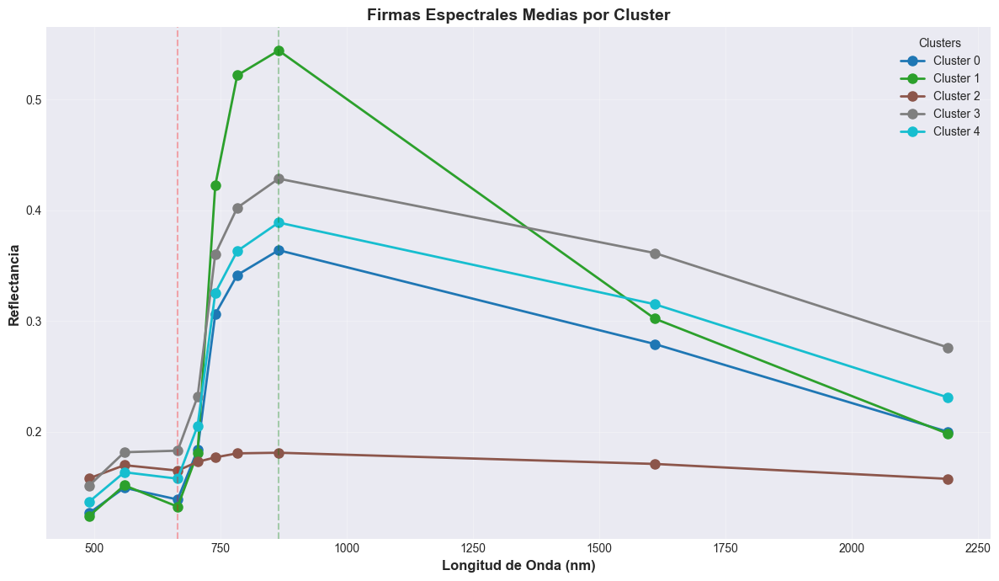

In [16]:
# ============================================================================
# VISUALIZACIÓN DE FIRMAS ESPECTRALES
# ============================================================================

# Definir longitudes de onda centrales de Sentinel-2 (en nanómetros)
sentinel_2_bandwidths = {
    'B02': [457, 522],   # Azul
    'B03': [542, 577],   # Verde
    'B04': [650, 680],   # Rojo
    'B05': [697, 712],   # Red Edge 1
    'B06': [732, 747],   # Red Edge 2
    'B07': [773, 793],   # Red Edge 3
    'B8A': [855, 875],   # NIR (Near Infrared)
    'B11': [1565, 1655], # SWIR1
    'B12': [2100, 2280]  # SWIR2
}

# Calcular centros de banda
centros_banda = {band: np.mean(rng) for band, rng in sentinel_2_bandwidths.items()}

# Calcular reflectancia media por cluster (ya calculado arriba)
# media_por_cluster ya está definido

# Graficar firmas espectrales
fig, ax = plt.subplots(figsize=(12, 7))

# Colores para cada cluster
colors = plt.cm.tab10(np.linspace(0, 1, len(media_por_cluster)))

for cluster, row in media_por_cluster.iterrows():
    x = [centros_banda[b] for b in bandas_s2]   # Longitudes de onda
    y = row.values / 10000                       # Convertir a reflectancia (0-1)
    
    ax.plot(x, y, marker='o', linewidth=2, markersize=8, 
            label=f'Cluster {cluster}', color=colors[cluster])

ax.set_xlabel('Longitud de Onda (nm)', fontsize=12, fontweight='bold')
ax.set_ylabel('Reflectancia', fontsize=12, fontweight='bold')
ax.set_title('Firmas Espectrales Medias por Cluster', fontsize=14, fontweight='bold')
ax.legend(title='Clusters', fontsize=10)
ax.grid(True, alpha=0.3)

# Agregar anotaciones de bandas importantes
ax.axvline(x=centros_banda['B04'], color='red', linestyle='--', alpha=0.3, label='Rojo')
ax.axvline(x=centros_banda['B8A'], color='green', linestyle='--', alpha=0.3, label='NIR')

plt.tight_layout()
plt.show()

#print("✅ Firmas espectrales visualizadas")
#print("   Interpretación:")
#print("   - Clusters con alta reflectancia en NIR (B8A) → Vegetación")
#print("   - Clusters con baja reflectancia general → Agua")
#print("   - Clusters con reflectancia creciente hacia SWIR → Suelo")

El nivel de detalle parece menor — genera clases amplias y más homogéneas. Las coberturas principales (agua, vegetación, suelo desnudo, urbano) se distinguen bien pero sin subcategorías. En cuanto a la fragmentacion es más limpia, con bloques compactos y bien delimitados. Menos “salpicaduras” dentro del agua o los campos. Agrupa la vegetación agrícola en una sola clase y los suelos desnudos y las zonas urbanas los agrup

#### 4.4.1 Asignación de Clases Semánticas

Basándonos en:
- Análisis de firmas espectrales
- Comparación visual con la imagen RGB original
- Conocimiento del área de estudio

Asignamos las siguientes clases a los clusters:

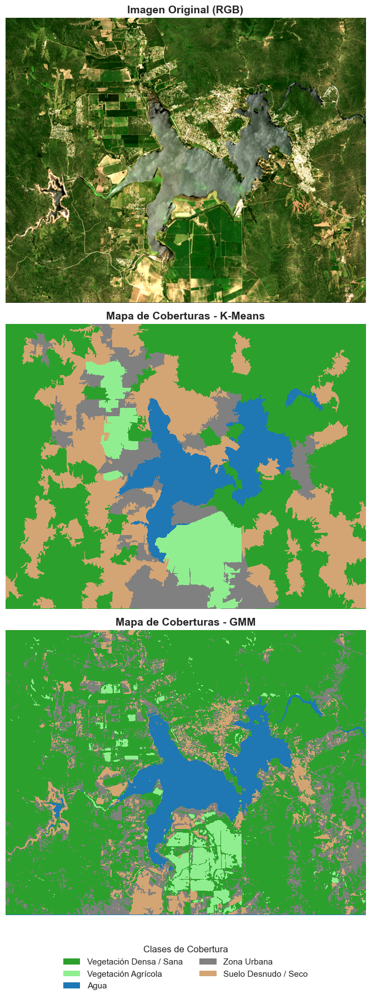


📋 Clases identificadas - K-Means:
   Vegetación Densa / Sana: 46.6% del área
   Vegetación Agrícola: 7.2% del área
   Agua: 9.5% del área
   Zona Urbana: 11.9% del área
   Suelo Desnudo / Seco: 24.8% del área

📋 Clases identificadas - GMM:
   Vegetación Densa / Sana: 64.5% del área
   Vegetación Agrícola: 4.4% del área
   Agua: 9.1% del área
   Zona Urbana: 14.8% del área
   Suelo Desnudo / Seco: 7.1% del área


In [17]:
# ============================================================================
# MAPA FINAL DE COBERTURAS DEL SUELO (VERTICAL)
# ============================================================================

# Diccionario de asignación: cluster_id -> nombre de clase
# NOTA: Estos valores deben ajustarse según tu análisis específico
clases_dict = {
    0: "Vegetación Densa / Sana",
    1: "Vegetación Agrícola",
    2: "Agua",
    3: "Zona Urbana",
    4: "Suelo Desnudo / Seco"
}

# Colores representativos para cada clase (en orden de cluster)
colores_clases = [
    "#2ca02c",  # Verde oscuro - Vegetación densa
    "#90ee90",  # Verde claro - Vegetación agrícola
    "#1f77b4",  # Azul - Agua
    "#808080",  # Gris - Urbano
    "#d4a574"   # Marrón claro - Suelo
]

# ============================================================================
# MAPEO DE CLUSTERS DE GMM A CLASES
# ============================================================================
# IMPORTANTE: Los clusters de GMM pueden no corresponder directamente a las 
# mismas clases que K-Means. Este diccionario permite mapear cada cluster de 
# GMM a una clase específica (y por tanto a un color específico).
#
# Formato: {cluster_gmm: clase_id}
# donde clase_id corresponde a las claves en clases_dict (0-4)
#
# Para personalizar, ajusta los valores según tu análisis visual de los clusters.
# Ejemplo: Si el cluster 0 de GMM representa "Agua", entonces: {0: 2}
#          (donde 2 es el ID de "Agua" en clases_dict)

mapeo_gmm_a_clase = {
    0: 3,  # Cluster 0 de GMM -> Clase 0 (Vegetación Densa / Sana)
    1: 0,  # Cluster 1 de GMM -> Clase 1 (Vegetación Agrícola)
    2: 1,  # Cluster 2 de GMM -> Clase 2 (Agua)
    3: 4,  # Cluster 3 de GMM -> Clase 3 (Zona Urbana)
    4: 2   # Cluster 4 de GMM -> Clase 4 (Suelo Desnudo / Seco)
}

# Aplicar mapeo a los labels de GMM
labels_gmm_original = labels_smooth.copy()
labels_gmm_mapped = np.zeros_like(labels_gmm_original, dtype=int)

# Mapear cada cluster de GMM a su clase correspondiente
for cluster_gmm, clase_id in mapeo_gmm_a_clase.items():
    mask = (labels_gmm_original == cluster_gmm)
    labels_gmm_mapped[mask] = clase_id

# Manejar valores fuera de rango (negativos o > 4)
labels_gmm_mapped[labels_gmm_mapped < 0] = 0
labels_gmm_mapped = np.clip(labels_gmm_mapped, 0, 4).astype(int)

# Crear mapa de colores personalizado
cmap_custom = ListedColormap(colores_clases)

# Crear figura con 3 filas y 1 columna
fig, axes = plt.subplots(3, 1, figsize=(10, 18))

# Imagen original
axes[0].imshow(rgb_normalized)
axes[0].set_title('Imagen Original (RGB)', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Mapa de coberturas con K-Means
axes[1].imshow(clasificado, cmap=cmap_custom,
               interpolation='nearest', vmin=0, vmax=4)
axes[1].set_title('Mapa de Coberturas - K-Means', fontsize=14, fontweight='bold')
axes[1].axis('off')

# Mapa de coberturas con GMM (con mapeo de colores personalizado)
axes[2].imshow(labels_gmm_mapped, cmap=cmap_custom,
               interpolation='nearest', vmin=0, vmax=4)
axes[2].set_title('Mapa de Coberturas - GMM', fontsize=14, fontweight='bold')
axes[2].axis('off')

# Leyenda personalizada
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor=colores_clases[i], label=clases_dict[i])
    for i in range(len(clases_dict))
]

# Agregar leyenda debajo del último gráfico
axes[2].legend(
    handles=legend_elements,
    loc='upper center',
    bbox_to_anchor=(0.5, -0.08),
    ncol=2,
    fontsize=11,
    title='Clases de Cobertura',
    title_fontsize=12
)

plt.tight_layout()
plt.show()


#print("✅ Mapas de coberturas generados (K-Means y GMM)")
#print("\n📋 Mapeo de clusters GMM a clases:")
#for cluster_gmm, clase_id in mapeo_gmm_a_clase.items():
#    print(f"   Cluster GMM {cluster_gmm} → {clases_dict[clase_id]} (color: {colores_clases[clase_id]})")

print("\n📋 Clases identificadas - K-Means:")
for cluster_id, nombre in clases_dict.items():
    n_pixels = np.sum(clasificado == cluster_id)
    porcentaje = (n_pixels / clasificado.size) * 100
    print(f"   {nombre}: {porcentaje:.1f}% del área")

print("\n📋 Clases identificadas - GMM:")
# Obtener valores únicos en labels_gmm_mapped y sus conteos
unique_gmm, counts_gmm = np.unique(labels_gmm_mapped, return_counts=True)
for cluster_id, count in zip(unique_gmm, counts_gmm):
    if cluster_id in clases_dict:
        porcentaje = (count / labels_gmm_mapped.size) * 100
        print(f"   {clases_dict[cluster_id]}: {porcentaje:.1f}% del área")

#print("\n💡 Para modificar los colores de GMM, edita el diccionario 'mapeo_gmm_a_clase' arriba.")
#print("   Ejemplo: Si quieres que el cluster 0 de GMM use el color de 'Agua', cambia {0: 0} a {0: 2}")

---

## 5. Conclusiones y Resultados

### 5.1 Resumen de Resultados

Este proyecto logró desarrollar un pipeline completo de clasificación de cobertura del suelo que:

✅ **Segmentación efectiva**: Reducción de ~1.2M píxeles a ~400 segmentos espacialmente coherentes  
✅ **Clasificación precisa**: Identificación de 5 clases principales de cobertura  
✅ **Análisis espectral robusto**: Validación mediante firmas espectrales  
✅ **Exportación GIS**: Resultados compatibles con herramientas profesionales (QGIS, ArcGIS)

### 5.2 Hallazgos Principales

1. **Efectividad de SLIC**: La segmentación SLIC mejoró significativamente la coherencia espacial de la clasificación comparado con clasificación pixel-by-pixel.

2. **K-Means vs GMM**: 
   - K-Means: Más rápido y eficiente, adecuado para clases bien separadas
   - GMM: Mejor para capturar transiciones graduales y clases espectralmente similares

3. **Separabilidad espectral**: Las clases principales (agua, vegetación, suelo) mostraron buena separabilidad en las bandas NIR y SWIR de Sentinel-2.

### 5.3 Limitaciones y Consideraciones

- **Validación**: El proyecto utiliza clasificación no supervisada. Para validación cuantitativa, se requerirían datos de referencia (ground truth).
- **Parámetros**: Los resultados dependen de los parámetros de segmentación y clustering seleccionados.
- **Escalabilidad**: El procesamiento de imágenes más grandes podría requerir optimizaciones adicionales.

### 5.4 Extensiones y Mejoras Futuras

Este proyecto puede extenderse en múltiples direcciones:

#### 5.4.1 Mejoras Técnicas

1. **Validación cuantitativa**
   - Incorporar datos de referencia (ground truth)
   - Calcular métricas de precisión (matriz de confusión, Kappa, F1-score)
   - Análisis de errores por clase

2. **Clasificación supervisada**
   - Implementar Random Forest o SVM con datos de entrenamiento
   - Comparar rendimiento con métodos no supervisados
   - Análisis de importancia de características

3. **Deep Learning**
   - U-Net o SegNet para segmentación semántica
   - Transfer learning con modelos pre-entrenados
   - Clasificación end-to-end sin segmentación previa

4. **Análisis temporal**
   - Series temporales multi-fecha
   - Detección de cambios de cobertura
   - Monitoreo de cultivos estacionales

#### 5.4.2 Aplicaciones Prácticas

1. **Agricultura de precisión**
   - Delimitación automática de parcelas
   - Monitoreo de salud de cultivos (NDVI, EVI)
   - Estimación de rendimiento

2. **Planificación urbana**
   - Expansión urbana y crecimiento
   - Índices de vegetación urbana
   - Análisis de impermeabilización del suelo

3. **Monitoreo ambiental**
   - Cambios en cuerpos de agua
   - Degradación de vegetación
   - Impacto de actividades humanas

#### 5.4.3 Optimizaciones

1. **Procesamiento eficiente**
   - Paralelización con Dask o multiprocessing
   - Procesamiento por tiles para imágenes grandes
   - Optimización de memoria

2. **Automatización**
   - Pipeline end-to-end automatizado
   - Integración con APIs de Sentinel Hub
   - Procesamiento en la nube (Google Earth Engine, AWS)

---

## 6. Referencias y Recursos

### Datos
- **Sentinel-2**: Programa Copernicus de la ESA
- **Descarga**: [Copernicus Open Access Hub](https://scihub.copernicus.eu/)

### Librerías Utilizadas
- `rasterio`: Procesamiento de datos geoespaciales
- `scikit-image`: Segmentación de imágenes
- `scikit-learn`: Machine learning
- `pandas`, `numpy`: Análisis de datos
- `matplotlib`: Visualización

### Documentación Técnica
- SLIC: Achanta et al. (2012) "SLIC Superpixels Compared to State-of-the-art"
- Sentinel-2: [Documentación ESA](https://sentinel.esa.int/web/sentinel/user-guides/sentinel-2-msi)

---

## 7. Información del Proyecto

**Autor**: Fernando Terreno  
**Fecha**: 2026  
**Licencia**: Este proyecto es de uso educativo y profesional  
**Repositorio**: [Enlace a GitHub si aplica]

---

*Este notebook demuestra habilidades en análisis geoespacial, machine learning no supervisado, procesamiento de imágenes satelitales y visualización de datos. Para más información o colaboraciones, contactar al autor.*